In [27]:
# Import the modules
import numpy as np
import pandas as pd
from pathlib import Path
from sklearn.metrics import confusion_matrix, classification_report

---

## Split the Data into Training and Testing Sets

### Step 1: Read the `lending_data.csv` data from the `Resources` folder into a Pandas DataFrame.

In [28]:
import importlib
import pandas as pd

# Reload the pandas module to restore the original functions
importlib.reload(pd)

# Now re-run your code
file_path = '/Users/cmatthews/Desktop/Data-Analyst/Projects/Credit Risk Classification Analysis/Resources/lending_data.csv'
lending_data = pd.read_csv(file_path)

# Display the first few rows of the DataFrame
lending_data.head()



,loan_size,interest_rate,borrower_income,debt_to_income,num_of_accounts,derogatory_marks,total_debt,loan_status
0,10700.0,7.672,52800,0.431818,5,1,22800,0
1,8400.0,6.692,43600,0.311927,3,0,13600,0
2,9000.0,6.963,46100,0.349241,3,0,16100,0
3,10700.0,7.664,52700,0.430740,5,1,22700,0
4,10800.0,7.698,53000,0.433962,5,1,23000,0


### Step 2: Create the labels set (`y`)  from the “loan_status” column, and then create the features (`X`) DataFrame from the remaining columns.

In [29]:
# Separate the y variable, the labels
y = lending_data['loan_status']

# Separate the X variable, the features
X = lending_data.drop(columns=['loan_status'])

# Display the first few rows to confirm
X.head(), y.head()


(   loan_size  interest_rate  borrower_income  debt_to_income  num_of_accounts  \
 0    10700.0          7.672            52800        0.431818                5   
 1     8400.0          6.692            43600        0.311927                3   
 2     9000.0          6.963            46100        0.349241                3   
 3    10700.0          7.664            52700        0.430740                5   
 4    10800.0          7.698            53000        0.433962                5   
 
    derogatory_marks  total_debt  
 0                 1       22800  
 1                 0       13600  
 2                 0       16100  
 3                 1       22700  
 4                 1       23000  ,
 0    0
 1    0
 2    0
 3    0
 4    0
 Name: loan_status, dtype: int64)

In [30]:
# Review the y variable Series
# YOUR CODE HERE!
# Display the first few entries in the y variable
print(y.head())

# Get a summary of the y variable
print(y.describe())

# Display the distribution of values in the y variable
print(y.value_counts())


0    0
1    0
2    0
3    0
4    0
Name: loan_status, dtype: int64
count    77536.000000
mean         0.032243
std          0.176646
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: loan_status, dtype: float64
loan_status
0    75036
1     2500
Name: count, dtype: int64


In [31]:
# Review the X variable DataFrame
# YOUR CODE HERE!
# Display the first few rows of the X DataFrame
print(X.head())

# Get a summary of the X DataFrame
print(X.describe())

# Check for missing values in the X DataFrame
print(X.isnull().sum())

# Display the data types of each column in the X DataFrame
print(X.dtypes)


   loan_size  interest_rate  borrower_income  debt_to_income  num_of_accounts  \
0    10700.0          7.672            52800        0.431818                5   
1     8400.0          6.692            43600        0.311927                3   
2     9000.0          6.963            46100        0.349241                3   
3    10700.0          7.664            52700        0.430740                5   
4    10800.0          7.698            53000        0.433962                5   

   derogatory_marks  total_debt  
0                 1       22800  
1                 0       13600  
2                 0       16100  
3                 1       22700  
4                 1       23000  
          loan_size  interest_rate  borrower_income  debt_to_income  \
count  77536.000000   77536.000000     77536.000000    77536.000000   
mean    9805.562577       7.292333     49221.949804        0.377318   
std     2093.223153       0.889495      8371.635077        0.081519   
min     5000.000000      

### Step 3: Split the data into training and testing datasets by using `train_test_split`.

In [32]:
# Import the train_test_learn module
from sklearn.model_selection import train_test_split

# Split the data using train_test_split
# Assign a random_state of 1 to the function
# YOUR CODE HERE!
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
# Assigning 20% of the data to the test set and setting random_state to 1 for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Display the shape of the resulting datasets to confirm the split
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")


X_train shape: (62028, 7)
X_test shape: (15508, 7)
y_train shape: (62028,)
y_test shape: (15508,)


---

## Create a Logistic Regression Model with the Original Data

###  Step 1: Fit a logistic regression model by using the training data (`X_train` and `y_train`).

In [33]:
# Import the LogisticRegression module from SKLearn
from sklearn.linear_model import LogisticRegression

# Instantiate the Logistic Regression model
# Assigning a random_state of 1 for reproducibility
model = LogisticRegression(random_state=1)

# Fit the model using the training data
model.fit(X_train, y_train)

# Display the model to confirm it has been created and trained
print(model)


LogisticRegression(random_state=1)


### Step 2: Save the predictions on the testing data labels by using the testing feature data (`X_test`) and the fitted model.

In [34]:
# Make a prediction using the testing data
# YOUR CODE HERE!
# Make predictions using the test data
y_pred = model.predict(X_test)

# Display the first few predictions to confirm
print(y_pred[:10])

# Optionally, you can compare these predictions with the actual labels
print(y_test[:10].values)


[0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0]


### Step 3: Evaluate the model’s performance by doing the following:

* Generate a confusion matrix.

* Print the classification report.

In [35]:
# Generate a confusion matrix for the model
from sklearn.metrics import confusion_matrix

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Display the confusion matrix
print(conf_matrix)


[[14924    77]
 [   31   476]]


In [36]:
# Print the classification report for the model
from sklearn.metrics import classification_report

# Generate the classification report
class_report = classification_report(y_test, y_pred)

# Display the classification report
print(class_report)


              precision    recall  f1-score   support

           0       1.00      0.99      1.00     15001
           1       0.86      0.94      0.90       507

    accuracy                           0.99     15508
   macro avg       0.93      0.97      0.95     15508
weighted avg       0.99      0.99      0.99     15508



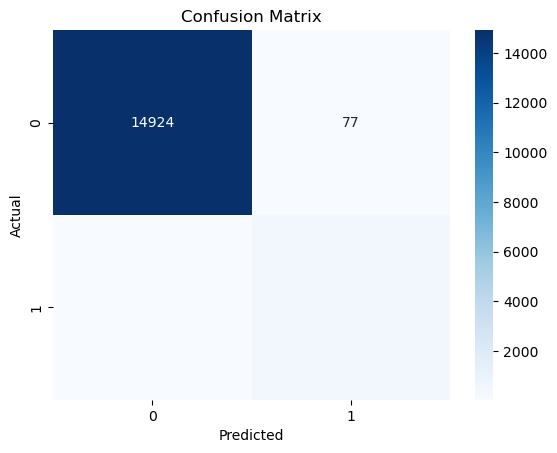

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the confusion matrix as a heatmap
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


In [38]:
import plotly.figure_factory as ff
import numpy as np

# Create a confusion matrix as an array
z = conf_matrix

# Define the text for the heatmap
x = ['Predicted Negative', 'Predicted Positive']
y = ['Actual Negative', 'Actual Positive']

# Create the Plotly heatmap
fig = ff.create_annotated_heatmap(z, x=x, y=y, colorscale='Viridis', showscale=True)

# Update the layout for better readability
fig.update_layout(
    title='Confusion Matrix',
    xaxis=dict(title='Predicted Label'),
    yaxis=dict(title='True Label'),
)

# Show the interactive plot
fig.show()


In [39]:
import plotly.express as px

# Create an interactive histogram
fig = px.histogram(
    lending_data, 
    x='interest_rate', 
    color='loan_status', 
    nbins=30,  # Adjust the number of bins for granularity
    title='Distribution of Interest Rates by Loan Status',
    labels={
        'interest_rate': 'Interest Rate',
        'loan_status': 'Loan Status'
    },
    marginal='box',  # Adds a box plot on top of the histogram for more detail
    hover_data=lending_data.columns  # Show all the columns on hover
)

# Show the interactive plot
fig.show()


### Step 4: Answer the following question.

**Question:** How well does the logistic regression model predict both the `0` (healthy loan) and `1` (high-risk loan) labels?

**Answer:** 

If the model has high precision and recall for both classes (0 and 1), it means the model is good at distinguishing between healthy and high-risk loans.
If there is a significant difference between the metrics for the two classes, it suggests that the model may be biased towards one class, possibly due to an imbalance in the dataset or other factors.

---